In [ ]:
!pip install -U sentence-transformers
!pip install ipympl

In [ ]:
!ls

data.csv  sample_data


In [ ]:
import pandas as pd
import numpy as np
import requests
import os
import json
import torch
import numpy as np
import pandas as pd
from tqdm import tqdm
import re
from wordcloud import WordCloud, STOPWORDS
import matplotlib
import matplotlib.pyplot as plt
%matplotlib widget
%matplotlib inline

In [ ]:
data = pd.read_csv('data.csv')

In [ ]:
clothes = data[(data.Clusters == 1) | (data.Clusters == 10)]
electronics = data[(data.Clusters == 2) | (data.Clusters == 7) | (data.Clusters == 20)]

# Analysis for Clothes and accesories

In [ ]:
from sentence_transformers import SentenceTransformer
embedder = SentenceTransformer('distilbert-base-nli-stsb-mean-tokens')

100%|██████████| 245M/245M [00:10<00:00, 24.4MB/s]


In [ ]:
corpus = np.array(clothes['Description'])
corpus_embeddings = embedder.encode(corpus, batch_size=512, show_progress_bar=True)

In [ ]:
corpus_embeddings.shape

(16038, 768)

In [ ]:
from sklearn.cluster import KMeans

num_clusters = 5
clustering_model = KMeans(n_clusters=num_clusters)
clustering_model.fit(corpus_embeddings)
cluster_assignment = clustering_model.labels_

In [ ]:
clothes['Clusters'] = cluster_assignment
clothes.to_csv('clothes.csv', index=None)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
# Define a function to plot word cloud
def plot_cloud(wordcloud):
    # Set figure size
    plt.figure(figsize=(40, 30))
    # Display image
    plt.imshow(wordcloud) 
    # No axis details
    plt.axis("off");

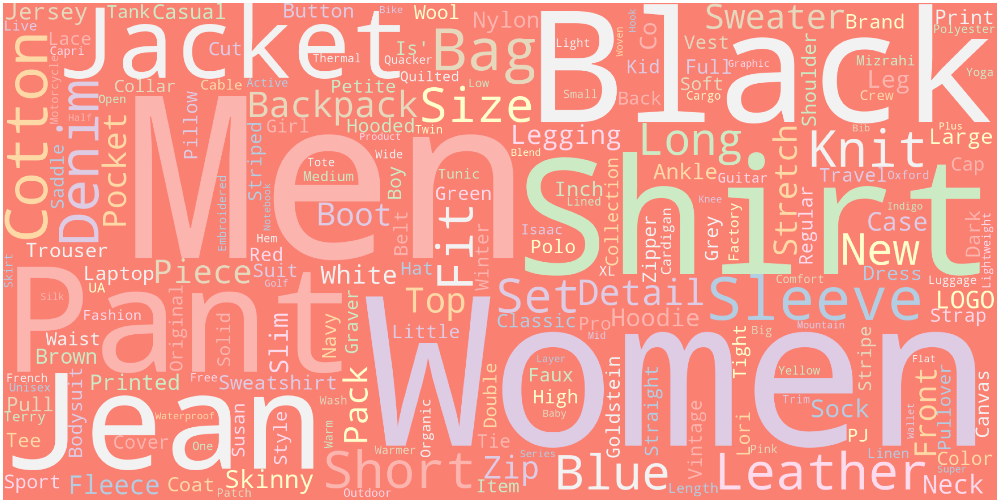

In [ ]:
temp = ' '.join(clothes[clothes.Clusters == 0]['Title'])
text = re.sub(r'==.*?==+', '', temp)
text = text.replace('\n', '')

wordcloud = WordCloud(width = 2000, height = 1000, random_state=1, background_color='salmon', colormap='Pastel1', collocations=False, stopwords = STOPWORDS).generate(text)
plot_cloud(wordcloud)

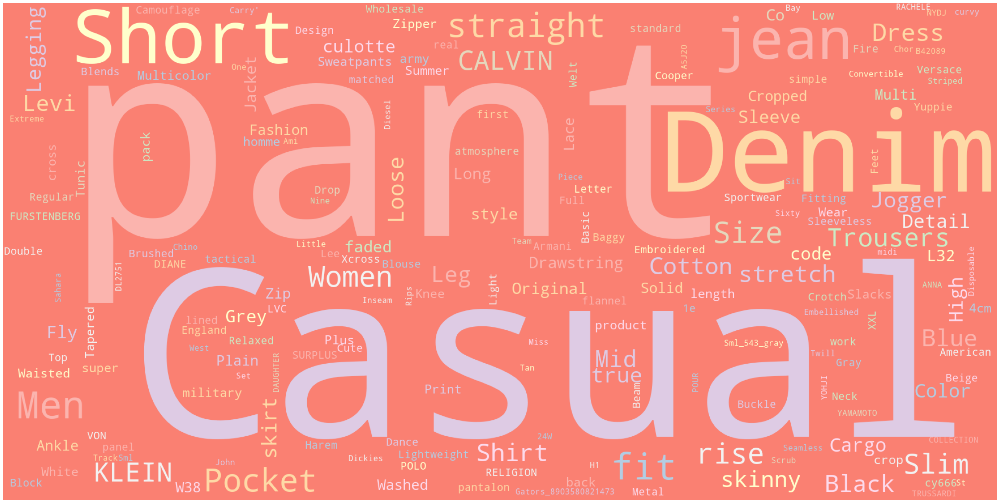

In [ ]:
temp = ' '.join(clothes[clothes.Clusters == 1]['Title'])
text = re.sub(r'==.*?==+', '', temp)
text = text.replace('\n', '')

wordcloud = WordCloud(width = 2000, height = 1000, random_state=1, background_color='salmon', colormap='Pastel1', collocations=False, stopwords = STOPWORDS).generate(text)
plot_cloud(wordcloud)

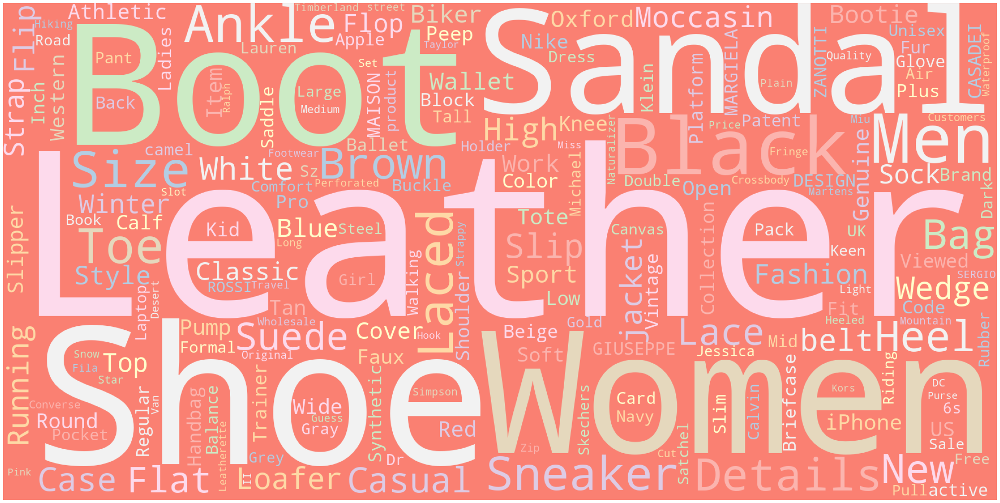

In [ ]:
temp = ' '.join(clothes[clothes.Clusters == 2]['Title'])
text = re.sub(r'==.*?==+', '', temp)
text = text.replace('\n', '')

wordcloud = WordCloud(width = 2000, height = 1000, random_state=1, background_color='salmon', colormap='Pastel1', collocations=False, stopwords = STOPWORDS).generate(text)
plot_cloud(wordcloud)

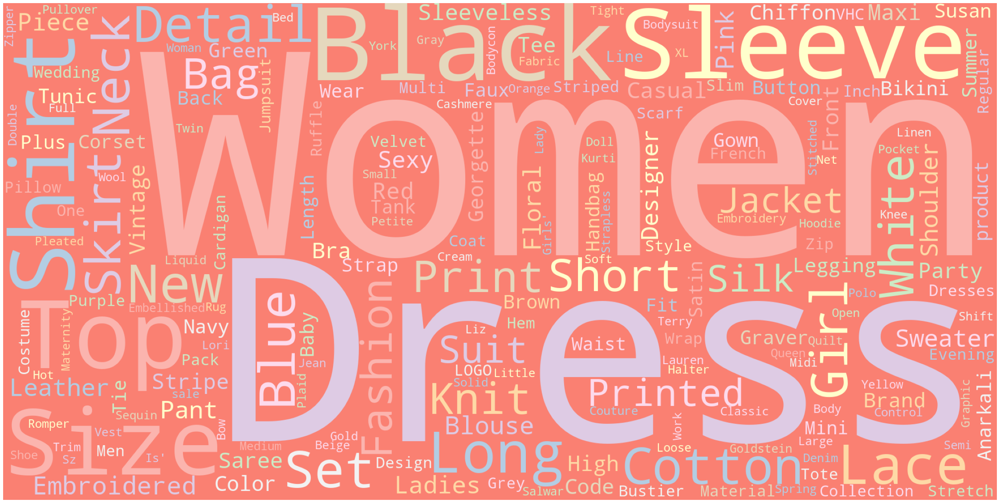

In [ ]:
temp = ' '.join(clothes[clothes.Clusters == 3]['Title'])
text = re.sub(r'==.*?==+', '', temp)
text = text.replace('\n', '')

wordcloud = WordCloud(width = 2000, height = 1000, random_state=1, background_color='salmon', colormap='Pastel1', collocations=False, stopwords = STOPWORDS).generate(text)
plot_cloud(wordcloud)

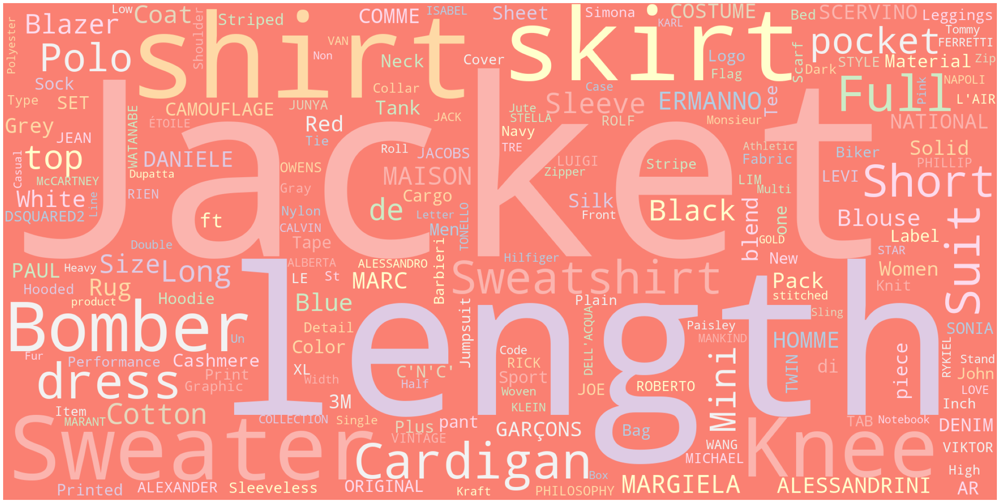

In [ ]:
temp = ' '.join(clothes[clothes.Clusters == 4]['Title'])
text = re.sub(r'==.*?==+', '', temp)
text = text.replace('\n', '')

wordcloud = WordCloud(width = 2000, height = 1000, random_state=1, background_color='salmon', colormap='Pastel1', collocations=False, stopwords = STOPWORDS).generate(text)
plot_cloud(wordcloud)

## **Analysis for electronics**

In [ ]:
corpus = np.array(electronics['Description'])
corpus_embeddings = embedder.encode(corpus, batch_size=512, show_progress_bar=True)

In [ ]:
corpus_embeddings.shape

(29214, 768)

In [ ]:
num_clusters = 5
clustering_model = KMeans(n_clusters=num_clusters)
clustering_model.fit(corpus_embeddings)
cluster_assignment = clustering_model.labels_

In [ ]:
electronics['Clusters'] = cluster_assignment
electronics.to_csv('electronics.csv', index=None)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


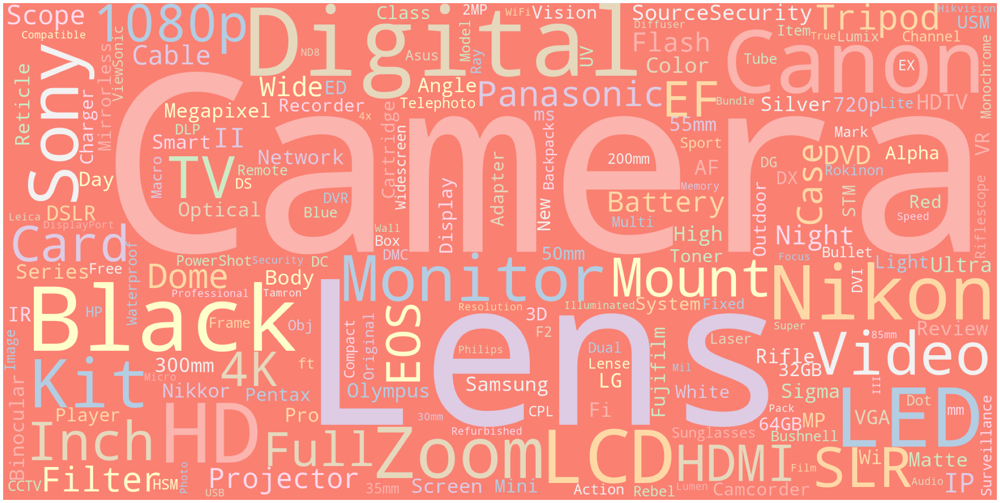

In [ ]:
temp = ' '.join(electronics[electronics.Clusters == 0]['Title'])
text = re.sub(r'==.*?==+', '', temp)
text = text.replace('\n', '')

wordcloud = WordCloud(width = 2000, height = 1000, random_state=1, background_color='salmon', colormap='Pastel1', collocations=False, stopwords = STOPWORDS).generate(text)
plot_cloud(wordcloud)

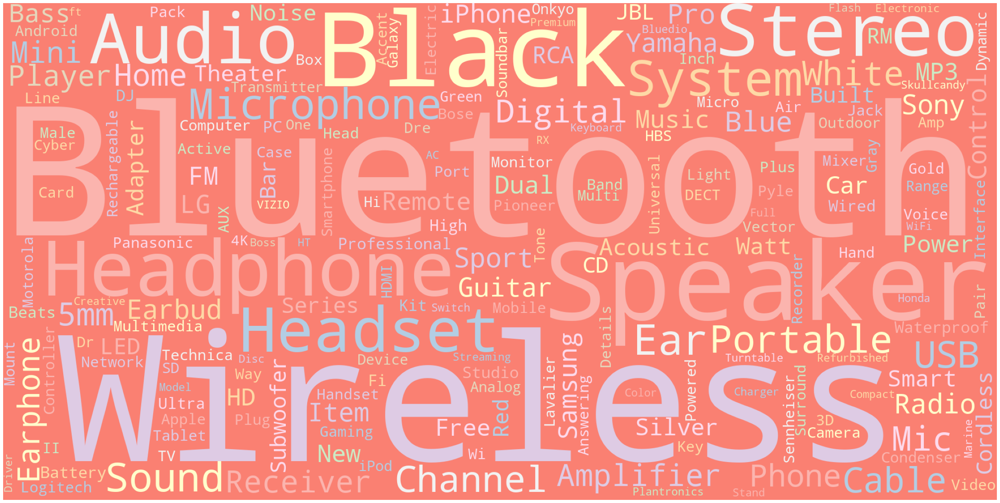

In [ ]:
temp = ' '.join(electronics[electronics.Clusters == 1]['Title'])
text = re.sub(r'==.*?==+', '', temp)
text = text.replace('\n', '')

wordcloud = WordCloud(width = 2000, height = 1000, random_state=1, background_color='salmon', colormap='Pastel1', collocations=False, stopwords = STOPWORDS).generate(text)
plot_cloud(wordcloud)

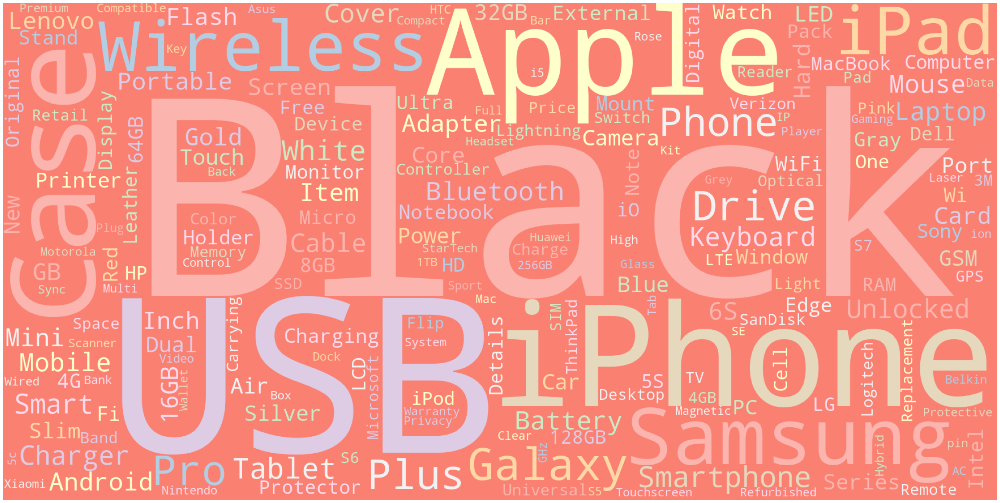

In [ ]:
temp = ' '.join(electronics[electronics.Clusters == 2]['Title'])
text = re.sub(r'==.*?==+', '', temp)
text = text.replace('\n', '')

wordcloud = WordCloud(width = 2000, height = 1000, random_state=1, background_color='salmon', colormap='Pastel1', collocations=False, stopwords = STOPWORDS).generate(text)
plot_cloud(wordcloud)

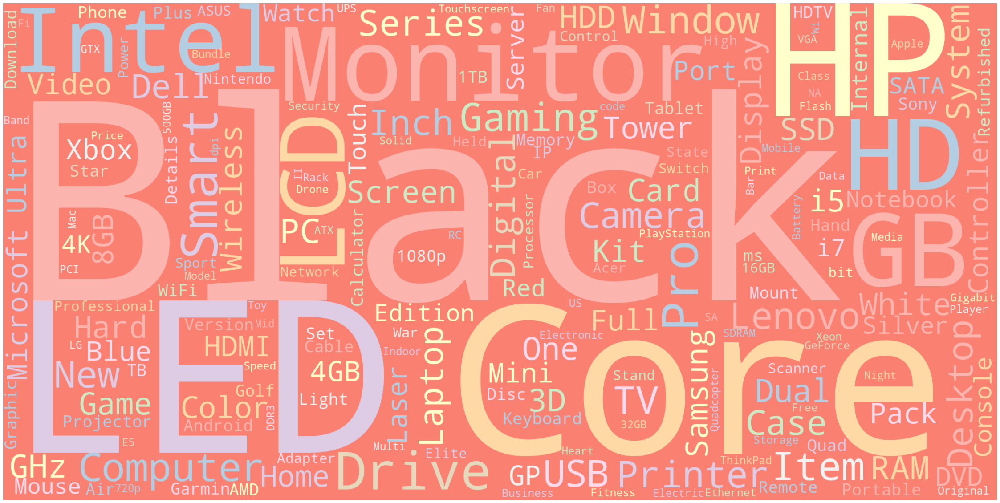

In [ ]:
temp = ' '.join(electronics[electronics.Clusters == 3]['Title'])
text = re.sub(r'==.*?==+', '', temp)
text = text.replace('\n', '')

wordcloud = WordCloud(width = 2000, height = 1000, random_state=1, background_color='salmon', colormap='Pastel1', collocations=False, stopwords = STOPWORDS).generate(text)
plot_cloud(wordcloud)

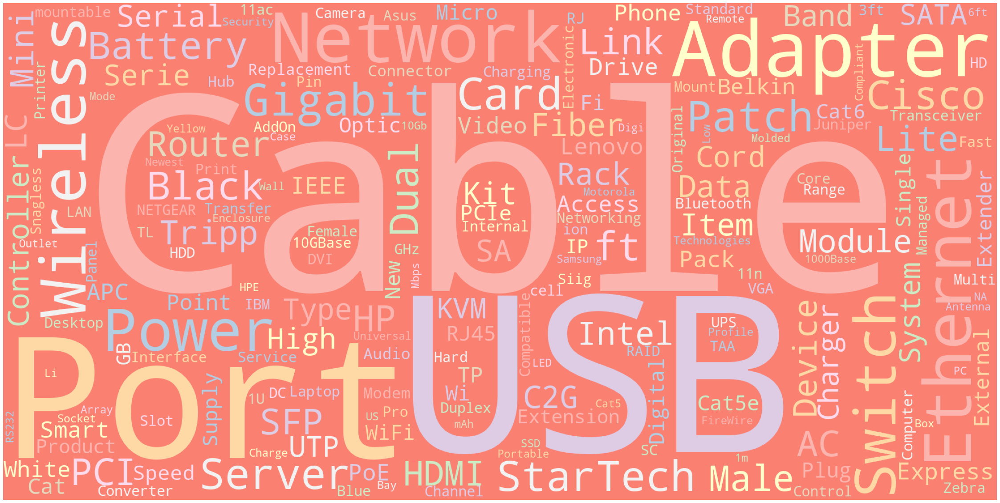

In [ ]:
temp = ' '.join(electronics[electronics.Clusters == 4]['Title'])
text = re.sub(r'==.*?==+', '', temp)
text = text.replace('\n', '')

wordcloud = WordCloud(width = 2000, height = 1000, random_state=1, background_color='salmon', colormap='Pastel1', collocations=False, stopwords = STOPWORDS).generate(text)
plot_cloud(wordcloud)